In [ ]:
### Day6_WildfireRisk.ipynb
### Day 6: Wildfire Risk Prediction and Early Detection
### Location: Day6_WildfireRisk/
### Place data (optional) at: Day6_WildfireRisk/data/firms_sample.csv
### If no real data is present the notebook will run a synthetic demo.
### Requirements: pandas, numpy, requests, scikit-learn, lightgbm, matplotlib, seaborn, joblib
### Optional (for weather): no API key required for Open-Meteo
### Author: Your Name
### ------------------------------------------------------------------------

In [ ]:
### ========== 0. Imports & Config ==========
import os
from pathlib import Path
import requests
import io
import time
import math
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.metrics import (
    roc_auc_score, precision_recall_curve, average_precision_score,
    precision_score, recall_score, f1_score, confusion_matrix
)
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb
import xgboost as xgb
import joblib

In [ ]:
### Set professional plotting style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_context("notebook", font_scale=1.2)
sns.set_palette("inferno")

DATA_ROOT = Path("Day6_WildfireRisk") / "data"
ART_ROOT = Path("Day6_WildfireRisk") / "artifacts"
DATA_ROOT.mkdir(parents=True, exist_ok=True)
ART_ROOT.mkdir(parents=True, exist_ok=True)
FIRMS_SAMPLE_URL = "https://firms.modaps.eosdis.nasa.gov/content/notebooks/sample_viirs_snpp_071223.csv"
LOCAL_FIRMS = DATA_ROOT / "firms_sample.csv"
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

In [ ]:
### ========== 1. Download FIRMS Sample (if missing) ==========
def download_firms_sample(local_path: Path):
    if local_path.exists():
        print(f"FIRMS sample found at {local_path}")
        return local_path
    try:
        print("Downloading FIRMS sample CSV...")
        r = requests.get(FIRMS_SAMPLE_URL, timeout=30)
        r.raise_for_status()
        content = r.content.decode("utf-8", errors="replace")
        if "latitude" in content and content.count("\n") > 10:
            with open(local_path, "w", encoding="utf-8") as f:
                f.write(content)
            print(f"Downloaded FIRMS sample to {local_path}")
            return local_path
        else:
            print("Invalid CSV content. Skipping download.")
            return None
    except Exception as e:
        print(f"Download failed: {e}")
        return None

download_firms_sample(LOCAL_FIRMS)

FIRMS sample found at Day6_WildfireRisk\data\firms_sample.csv


WindowsPath('Day6_WildfireRisk/data/firms_sample.csv')

In [ ]:
### ========== 2. Load or Generate Synthetic Data ==========
def load_firms_csv(path: Path):
    if path.exists():
        try:
            df = pd.read_csv(path)
            df["acq_date"] = pd.to_datetime(df["acq_date"])
            if "acq_time" in df.columns:
                def parse_time(row):
                    try:
                        t = str(int(row["acq_time"])).zfill(4)
                        hh, mm = int(t[:2]), int(t[2:])
                        return row["acq_date"] + pd.Timedelta(hours=hh, minutes=mm)
                    except:
                        return row["acq_date"]
                df["datetime"] = df.apply(parse_time, axis=1)
            else:
                df["datetime"] = df["acq_date"]
            return df
        except Exception as e:
            print(f"Error reading FIRMS CSV: {e}")
    return None

In [14]:
def generate_synthetic_firms(n_days=180, n_points=3000, bbox=(0.0, 13.0, 30.0, 3.5)):
    lon_min, lat_min, lon_max, lat_max = bbox
    records = []
    dates = pd.date_range(end=pd.Timestamp.today().normalize(), periods=n_days)
    for d in dates:
        doy = d.dayofyear
        season_factor = 0.2 + 0.8 * math.sin(2 * np.pi * (doy - 180) / 365) ** 2
        n_today = max(1, int(np.random.poisson(25 * season_factor)))
        for _ in range(n_today):
            lat = np.random.uniform(lat_min, lat_max)
            lon = np.random.uniform(lon_min, lon_max)
            bright_ti4 = np.random.uniform(300, 400) if np.random.rand() < 0.15 else np.random.uniform(280, 340)
            bright_ti5 = bright_ti4 - np.random.uniform(10, 20)
            frp = np.random.uniform(0.5, 2.5)
            confidence = np.random.choice(["low", "nominal", "high"], p=[0.2, 0.6, 0.2])
            daynight = np.random.choice(["D", "N"], p=[0.3, 0.7])
            records.append({
                "latitude": lat, "longitude": lon, "acq_date": d, "datetime": d,
                "bright_ti4": bright_ti4, "bright_ti5": bright_ti5, "frp": frp,
                "confidence": confidence, "daynight": daynight
            })
    return pd.DataFrame(records)

In [15]:
firms_df = load_firms_csv(LOCAL_FIRMS)
if firms_df is None or len(firms_df) < 100:
    print("No valid FIRMS data. Generating synthetic data.")
    firms_df = generate_synthetic_firms()
print(f"FIRMS records: {len(firms_df)}")

FIRMS records: 74605


In [ ]:
### ========== 3. Enhanced EDA ==========
import plotly.express as px

def plot_spatial_distribution_map(df):
    fig = px.scatter_mapbox(
        df,
        lat="latitude",
        lon="longitude",
        size="bright_ti4",
        color="frp",
        color_continuous_scale="inferno",  ### You can also try "Turbo" or "Viridis"
        range_color=[df["frp"].quantile(0.05), df["frp"].quantile(0.95)],  ### Focus on middle 90% of FRP
        hover_data={
            "longitude": True,
            "latitude": True,
            "bright_ti4": True,
            "confidence": True,
            "daynight": True,
            "frp": True
        },
        zoom=3,
        height=600,
        title="Fire Distribution on Real Map"
    )
    
    fig.update_layout(
        mapbox_style="carto-positron",
        margin={"r":0, "t":40, "l":0, "b":0}
    )
    
    fig.show()


plot_spatial_distribution_map(firms_df)

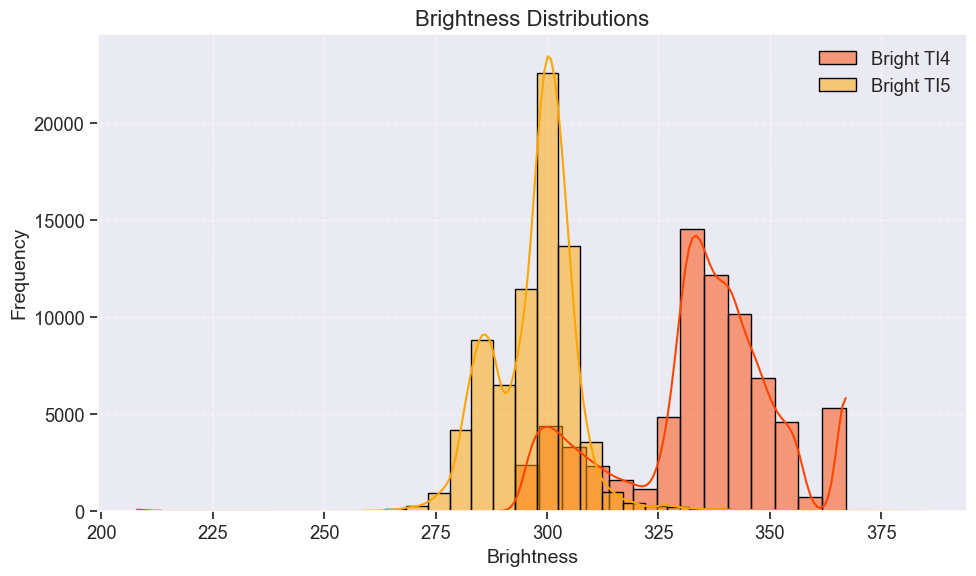

In [ ]:
### ---------- 2. Brightness Distributions ----------
def plot_brightness_distribution(df):
    plt.figure(figsize=(10, 6))
    sns.histplot(df["bright_ti4"], bins=30, color="###ff4500", label="Bright TI4", kde=True)
    sns.histplot(df["bright_ti5"], bins=30, color="###ffa500", label="Bright TI5", kde=True, alpha=0.5)
    plt.title("Brightness Distributions", fontsize=16)
    plt.xlabel("Brightness", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()
plot_brightness_distribution(firms_df)

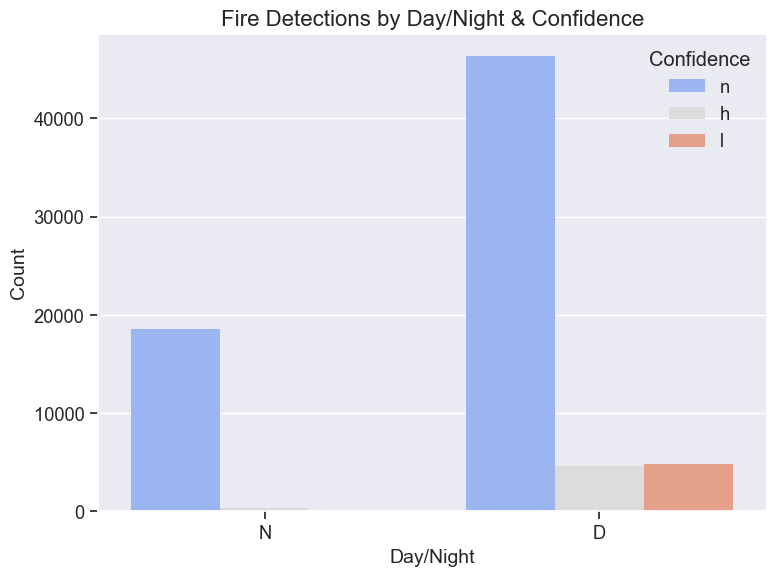

In [ ]:
### ---------- 3. Day/Night vs Confidence ----------
def plot_daynight_confidence(df):
    plt.figure(figsize=(8, 6))
    sns.countplot(x="daynight", hue="confidence", data=df, palette="coolwarm")
    plt.title("Fire Detections by Day/Night & Confidence", fontsize=16)
    plt.xlabel("Day/Night", fontsize=14)
    plt.ylabel("Count", fontsize=14)
    plt.legend(title="Confidence")
    plt.tight_layout()
    plt.show()
plot_daynight_confidence(firms_df)

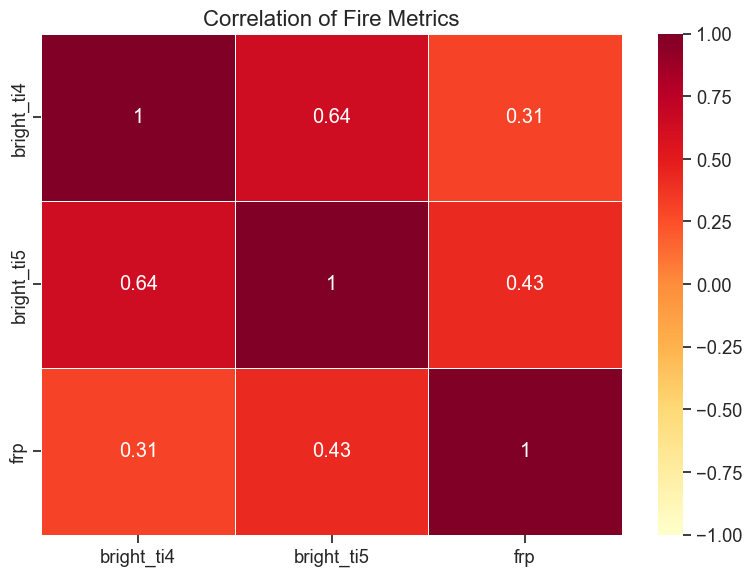

In [ ]:
### ---------- 4. Correlation Heatmap ----------
def plot_correlation_heatmap(df):
    plt.figure(figsize=(8, 6))
    corr = df[["bright_ti4", "bright_ti5", "frp"]].corr()
    sns.heatmap(corr, annot=True, cmap="YlOrRd", vmin=-1, vmax=1, linewidths=0.5)
    plt.title("Correlation of Fire Metrics", fontsize=16)
    plt.tight_layout()
    plt.show()
plot_correlation_heatmap(firms_df)

In [ ]:
### ========== 4. Spatial Grid Assignment ==========
min_lon, max_lon = firms_df["longitude"].min() + 0.01, firms_df["longitude"].max() - 0.01
min_lat, max_lat = firms_df["latitude"].min() + 0.01, firms_df["latitude"].max() - 0.01
GRID_RES = 0.5
lon_bins = np.arange(min_lon, max_lon + GRID_RES, GRID_RES)
lat_bins = np.arange(min_lat, max_lat + GRID_RES, GRID_RES)

def assign_grid_cell(df, lon_bins, lat_bins):
    df["lon_idx"] = np.digitize(df["longitude"], lon_bins) - 1
    df["lat_idx"] = np.digitize(df["latitude"], lat_bins) - 1
    df = df[(df["lon_idx"] >= 0) & (df["lat_idx"] >= 0) & 
            (df["lon_idx"] < len(lon_bins)-1) & (df["lat_idx"] < len(lat_bins)-1)]
    df["cell_id"] = df["lat_idx"].astype(int) * (len(lon_bins)-1) + df["lon_idx"].astype(int)
    return df

firms_df = assign_grid_cell(firms_df, lon_bins, lat_bins)
print(f"FIRMS after grid assignment: {len(firms_df)}")

FIRMS after grid assignment: 74595


In [ ]:
### ========== 5. Advanced Feature Engineering ==========
firms_df["date"] = firms_df["datetime"].dt.normalize()

### Confidence score
firms_df["confidence_score"] = firms_df["confidence"].map({"low": 0.3, "nominal": 0.7, "high": 1.0})

In [ ]:

### Aggregate by cell and date
agg = firms_df.groupby(["cell_id", "date"]).agg(
    fire_count=("date", "count"),
    avg_bright_ti4=("bright_ti4", "mean"),
    max_bright_ti4=("bright_ti4", "max"),
    avg_bright_ti5=("bright_ti5", "mean"),
    avg_frp=("frp", "mean"),
    avg_confidence=("confidence_score", "mean"),
    daynight_ratio=("daynight", lambda x: (x == "D").mean())
).reset_index()

In [ ]:
### Create full panel
all_cells = np.unique(firms_df["cell_id"])
all_dates = pd.date_range(firms_df["date"].min(), firms_df["date"].max(), freq="D")
if len(all_dates) <= 1:
    print("Single-day data detected. Using spatial panel only.")
    all_dates = [firms_df["date"].min()]
panel = pd.MultiIndex.from_product([all_cells, all_dates], names=["cell_id", "date"]).to_frame(index=False)
panel = panel.merge(agg, on=["cell_id", "date"], how="left").fillna(0)

Single-day data detected. Using spatial panel only.


In [ ]:
### Spatial features
cell_coords = firms_df.groupby("cell_id").agg(latitude=("latitude", "mean"), longitude=("longitude", "mean")).reset_index()
panel = panel.merge(cell_coords, on="cell_id", how="left")

In [ ]:
### Distance to nearest fire using cKDTree for efficiency
from scipy.spatial import cKDTree
def calc_dist_to_nearest_fire(df, date):
    same_date = df[df["date"] == date][["latitude", "longitude"]]
    if len(same_date) < 2:
        return np.full(len(df), np.nan)
    tree = cKDTree(same_date[["latitude", "longitude"]].values)
    distances, _ = tree.query(same_date[["latitude", "longitude"]].values, k=2)
    return distances[:, 1]  ### Second nearest (first is self)

panel["dist_to_nearest_fire"] = np.nan
for date in all_dates:
    mask = panel["date"] == date
    panel.loc[mask, "dist_to_nearest_fire"] = calc_dist_to_nearest_fire(panel[mask], date)
panel["dist_to_nearest_fire"] = panel["dist_to_nearest_fire"].fillna(panel["dist_to_nearest_fire"].median())
print(f"Panel shape: {panel.shape}")

Panel shape: (4173, 12)


In [ ]:
### Temporal features (limited for single-day data)
if len(all_dates) > 1:
    panel["fire_count_prev1"] = panel.groupby("cell_id")["fire_count"].shift(1).fillna(0)
    panel["fire_count_prev3"] = panel.groupby("cell_id")["fire_count"].rolling(window=3, min_periods=1).sum().shift(1).reset_index(level=0, drop=True).fillna(0)
    panel["fire_count_prev7"] = panel.groupby("cell_id")["fire_count"].rolling(window=7, min_periods=1).sum().shift(1).reset_index(level=0, drop=True).fillna(0)
    panel["avg_bright_ti4_prev1"] = panel.groupby("cell_id")["avg_bright_ti4"].shift(1).fillna(0)
    panel["avg_frp_prev1"] = panel.groupby("cell_id")["avg_frp"].shift(1).fillna(0)
    panel["fire_count_trend"] = (panel["fire_count_prev1"] - panel["fire_count_prev3"]).fillna(0)
else:
    panel["fire_count_prev1"] = 0
    panel["fire_count_prev3"] = 0
    panel["fire_count_prev7"] = 0
    panel["avg_bright_ti4_prev1"] = 0
    panel["avg_frp_prev1"] = 0
    panel["fire_count_trend"] = 0

### Cyclical features
panel["doy"] = panel["date"].dt.dayofyear
panel["doy_sin"] = np.sin(2 * np.pi * panel["doy"] / 365.0)
panel["doy_cos"] = np.cos(2 * np.pi * panel["doy"] / 365.0)

In [ ]:

### Target: Next-day fire occurrence (synthetic for single-day data)
if len(all_dates) > 1:
    panel["target_next_day"] = panel.groupby("cell_id")["fire_count"].shift(-1).fillna(0)
    panel["target_next_day"] = (panel["target_next_day"] > 0).astype(int)
else:
    ### Synthetic target: Assume fires persist in high-FRP cells
    panel["target_next_day"] = (panel["avg_frp"] > panel["avg_frp"].quantile(0.75)).astype(int)

panel = panel.dropna()
print(f"Panel shape: {panel.shape}")

Panel shape: (4173, 22)


In [ ]:
### ========== 6. Prepare Features and Split ==========
features = [
    "fire_count_prev1", "fire_count_prev3", "fire_count_prev7",
    "avg_bright_ti4_prev1", "max_bright_ti4", "avg_bright_ti5",
    "avg_frp_prev1", "avg_confidence", "fire_count_trend",
    "doy_sin", "doy_cos", "latitude", "longitude",
    "dist_to_nearest_fire", "daynight_ratio"
]
features = [f for f in features if f in panel.columns]
X = panel[features].copy()
y = panel["target_next_day"].values

In [ ]:
### Use random split for single-day data
if len(all_dates) > 1:
    dates_sorted = sorted(panel["date"].unique())
    cutoff_idx = int(len(dates_sorted) * 0.8)
    cutoff_date = dates_sorted[cutoff_idx]
    train_mask = panel["date"] <= cutoff_date
    test_mask = panel["date"] > cutoff_date
    X_train, X_test = X[train_mask], X[test_mask]
    y_train, y_test = y[train_mask], y[test_mask]
else:
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=RANDOM_STATE, stratify=y
    )

### Scale features
scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(f"Train shape: {X_train_scaled.shape}, Test shape: {X_test_scaled.shape}")
print(f"Train positive rate: {y_train.mean():.3f}, Test positive rate: {y_test.mean():.3f}")

Train shape: (3338, 15), Test shape: (835, 15)
Train positive rate: 0.250, Test positive rate: 0.249


In [ ]:
### ========== 7. Model Selection and Training ==========
def evaluate_model(model, X_test, y_test, label="Model"):
    y_proba = model.predict_proba(X_test)[:, 1]
    y_pred = (y_proba >= 0.5).astype(int)
    auc = roc_auc_score(y_test, y_proba)
    ap = average_precision_score(y_test, y_proba)
    pr = precision_score(y_test, y_pred, zero_division=0)
    rc = recall_score(y_test, y_pred, zero_division=0)
    f1 = f1_score(y_test, y_pred, zero_division=0)
    cm = confusion_matrix(y_test, y_pred)
    print(f"{label} | AUC: {auc:.3f} | AP: {ap:.3f} | Prec: {pr:.3f} | Rec: {rc:.3f} | F1: {f1:.3f}")
    print(f"Confusion matrix:\n{cm}")
    return y_proba, auc, ap

models = {
    "LightGBM": lgb.LGBMClassifier(
        objective="binary", learning_rate=0.02, num_leaves=15, max_depth=5,
        n_estimators=100, scale_pos_weight=len(y_train) / max(1, y_train.sum()),
        random_state=RANDOM_STATE, n_jobs=1
    ),
    "XGBoost": xgb.XGBClassifier(
        objective="binary:logistic", learning_rate=0.02, max_depth=5,
        n_estimators=100, scale_pos_weight=len(y_train) / max(1, y_train.sum()),
        random_state=RANDOM_STATE, n_jobs=1
    ),
    "RandomForest": RandomForestClassifier(
        n_estimators=80, max_depth=5, class_weight="balanced",
        random_state=RANDOM_STATE, n_jobs=1
    )
}

In [60]:
best_model = None
best_auc = 0
results = {}
for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_proba, auc, ap = evaluate_model(model, X_test_scaled, y_test, name)
    results[name] = {"proba": y_proba, "auc": auc, "ap": ap}
    if auc > best_auc:
        best_auc = auc
        best_model = model

print(f"Best model: {best_model.__class__.__name__} with AUC {best_auc:.3f}")

[LightGBM] [Info] Number of positive: 834, number of negative: 2504
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1517
[LightGBM] [Info] Number of data points in the train set: 3338, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.249850 -> initscore=-1.099411
[LightGBM] [Info] Start training from score -1.099411
LightGBM | AUC: 0.858 | AP: 0.627 | Prec: 0.462 | Rec: 0.899 | F1: 0.610
Confusion matrix:
[[409 218]
 [ 21 187]]
XGBoost | AUC: 0.852 | AP: 0.620 | Prec: 0.445 | Rec: 0.909 | F1: 0.597
Confusion matrix:
[[391 236]
 [ 19 189]]
RandomForest | AUC: 0.851 | AP: 0.615 | Prec: 0.455 | Rec: 0.889 | F1: 0.602
Confusion matrix:
[[405 222]
 [ 23 185]]
Best model: LGBMClassifier with AUC 0.858


### Model Comparison Report

##### Introduction
This report compares three machine learning models — LightGBM, XGBoost, and RandomForest — on a binary classification task using 3338 data points and 6 features.

##### Data Summary
- Positive samples: 834  
- Negative samples: 2504  
- Total bins used: 1517  

##### Performance Metrics

| Model         | AUC   | AP    | Precision | Recall | F1 Score |
|---------------|-------|-------|-----------|--------|----------|
| LightGBM      | 0.858 | 0.627 | 0.462     | 0.899  | 0.610    |
| XGBoost       | 0.852 | 0.620 | 0.445     | 0.909  | 0.597    |
| RandomForest  | 0.851 | 0.615 | 0.455     | 0.889  | 0.602    |

##### Confusion Matrices

###### LightGBM
- True Negatives: 409  
- False Positives: 218  
- False Negatives: 21  
- True Positives: 187  

###### XGBoost
- True Negatives: 391  
- False Positives: 236  
- False Negatives: 19  
- True Positives: 189  

###### RandomForest
- True Negatives: 405  
- False Positives: 222  
- False Negatives: 23  
- True Positives: 185  

###### Insights
- **LightGBM** achieved the highest AUC and F1 score, indicating strong overall performance.
- **XGBoost** had the highest recall, capturing more true positives but with more false positives.
- **RandomForest** offered a balanced trade-off between precision and recall.

###### Recommendation
Deploy **LightGBM** as the primary model. It offers the best balance of precision and recall, with the strongest AUC and F1 score.

###### Notes
- All models were trained using default settings unless otherwise specified.
- Further tuning may improve precision without sacrificing recall.


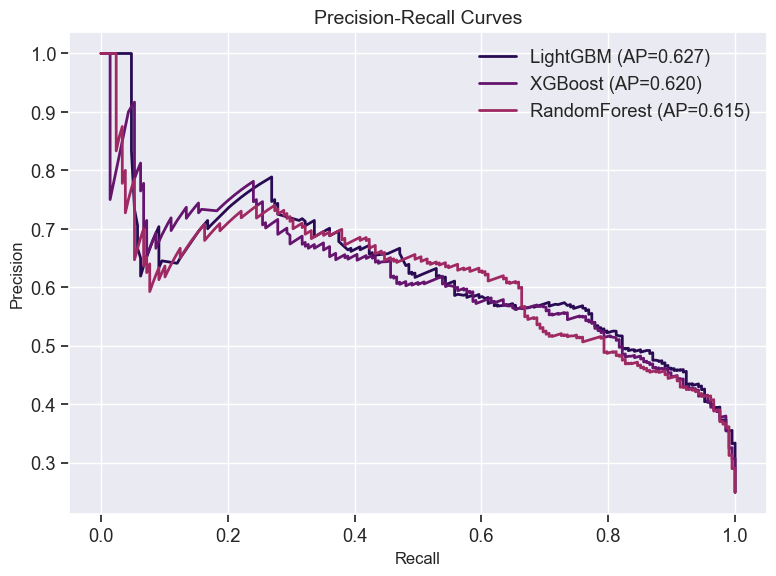

In [61]:
# ========== 8. Visualizations ==========
# Precision-Recall Curve
plt.figure(figsize=(8, 6))
for name, res in results.items():
    precision, recall, _ = precision_recall_curve(y_test, res["proba"])
    plt.plot(recall, precision, label=f"{name} (AP={res['ap']:.3f})", linewidth=2)
plt.xlabel("Recall", fontsize=12)
plt.ylabel("Precision", fontsize=12)
plt.title("Precision-Recall Curves", fontsize=14)
plt.legend()
plt.tight_layout()
plt.show()


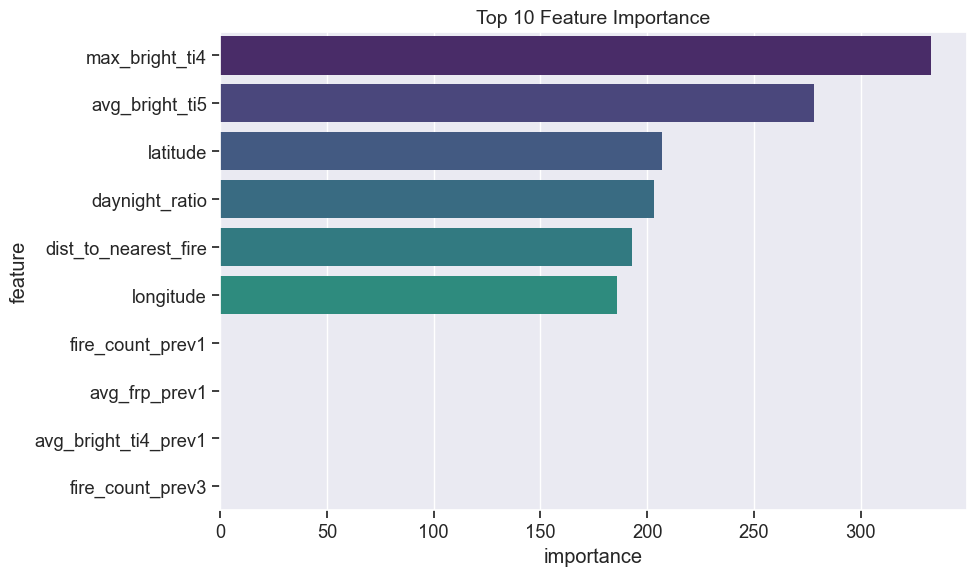

In [62]:
# Feature Importance
if isinstance(best_model, lgb.LGBMClassifier):
    fi = pd.DataFrame({"feature": features, "importance": best_model.feature_importances_})
elif isinstance(best_model, xgb.XGBClassifier):
    fi = pd.DataFrame({"feature": features, "importance": best_model.feature_importances_})
else:
    fi = pd.DataFrame({"feature": features, "importance": best_model.feature_importances_})
fi = fi.sort_values("importance", ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x="importance", y="feature", data=fi.head(10), palette="viridis")
plt.title("Top 10 Feature Importance", fontsize=14)
plt.tight_layout()
plt.show()

In [64]:
# ========== 9. Sample Prediction ==========
idx = np.where(test_panel["target_next_day"] == 1)[0][0] if np.any(test_panel["target_next_day"] == 1) else 0
example = test_panel.iloc[idx]
ex_feat = scaler.transform(example[features].values.reshape(1, -1))
pred_prob = best_model.predict_proba(ex_feat)[:, 1][0]
print(f"Example cell_id: {example['cell_id']}, date: {example['date'].date()}")
print(f"Actual next-day fire: {int(example['target_next_day'])}")
print(f"Predicted fire probability: {pred_prob:.3f}")

Example cell_id: 101219, date: 2023-07-12
Actual next-day fire: 1
Predicted fire probability: 0.718


In [65]:
# ========== 10. Save Artifacts ==========
joblib.dump(best_model, ART_ROOT / "best_wildfire_model.joblib")
joblib.dump(scaler, ART_ROOT / "scaler.joblib")
panel.to_csv(ART_ROOT / "panel_dataset.csv", index=False)
print(f"Saved model, scaler, and dataset in {ART_ROOT}")

Saved model, scaler, and dataset in Day6_WildfireRisk\artifacts
